In [4]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.layers import Flatten,Input,Reshape,Conv2D,Conv2DTranspose, BatchNormalization, LeakyReLU,Dense
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os


# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


## Prepare Data

In [5]:
BATCH_SIZE=128
IM_SHAPE=(64,64,3)
LEARNING_RATE=2e-4
LATENT_DIM=100
EPOCHS=20

In [6]:
dataset=tf.keras.preprocessing.image_dataset_from_directory('/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba',label_mode=None,image_size=(IM_SHAPE[0],IM_SHAPE[1]),batch_size=BATCH_SIZE)

Found 202599 files belonging to 1 classes.


In [7]:
dataset

<_BatchDataset element_spec=TensorSpec(shape=(None, 64, 64, 3), dtype=tf.float32, name=None)>

In [8]:
def preprocess(image):
    return tf.cast(image,dtype=tf.float32)/127.5 -1.0


In [9]:
train=(
    dataset
    .map(preprocess)
    .unbatch()
    .shuffle(buffer_size=1024,reshuffle_each_iteration=True)
    .batch(BATCH_SIZE,drop_remainder=True)
    .prefetch(tf.data.AUTOTUNE)
)

In [10]:
for d in train.take(1):
    print(d.shape)

(128, 64, 64, 3)


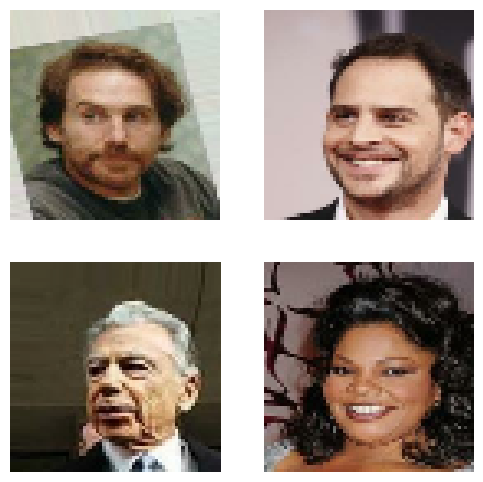

In [11]:
plt.figure(figsize=(6,6))
k=0
for i in range(4):
    ax=plt.subplot(2,2,k+1)
    plt.imshow((d[i]+1)/2)
    plt.axis('off')
    k+=1
    

## Modeling

## Generator

In [12]:
generator=tf.keras.Sequential([
                            Input(shape=(LATENT_DIM,)),
                            Dense(4*4*LATENT_DIM),
                            Reshape((4,4,LATENT_DIM)),
                            
                            Conv2DTranspose(512,kernel_size=4,strides=2,padding='same'),
                            BatchNormalization(),
                            LeakyReLU(0.2),
                            
                            Conv2DTranspose(256,kernel_size=4,strides=2,padding='same'),
                            BatchNormalization(),
                            LeakyReLU(0.2), 
                            
                            Conv2DTranspose(128,kernel_size=4,strides=2,padding='same'),
                            BatchNormalization(),
                            LeakyReLU(0.2), 
            
                            Conv2DTranspose(3,kernel_size=4,strides=2,padding='same',activation=tf.keras.activations.tanh),

],name='generator')
generator.summary()

Model: "generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 1600)              161600    
                                                                 
 reshape (Reshape)           (None, 4, 4, 100)         0         
                                                                 
 conv2d_transpose (Conv2DTr  (None, 8, 8, 512)         819712    
 anspose)                                                        
                                                                 
 batch_normalization (Batch  (None, 8, 8, 512)         2048      
 Normalization)                                                  
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 8, 8, 512)         0         
                                                                 
 conv2d_transpose_1 (Conv2D  (None, 16, 16, 256)       20

## Discriminator

In [13]:
discriminator=tf.keras.Sequential([
                            Input(shape=(IM_SHAPE[0],IM_SHAPE[1],3)),
                            
                            Conv2D(64,kernel_size=4,strides=2,padding='same'),
                            LeakyReLU(0.2),
                                
                            Conv2D(128,kernel_size=4,strides=2,padding='same'),
                            BatchNormalization(),
                            LeakyReLU(0.2),
    
    
                            Conv2D(256,kernel_size=4,strides=2,padding='same'),
                            BatchNormalization(),
                            LeakyReLU(0.2),
    
                            Conv2D(1,kernel_size=4,strides=2,padding='same'),
    
                            Flatten(),
                            
                            Dense(1,activation='sigmoid')
                            
],name='discriminator')
discriminator.summary()

Model: "discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 32, 32, 64)        3136      
                                                                 
 leaky_re_lu_3 (LeakyReLU)   (None, 32, 32, 64)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 128)       131200    
                                                                 
 batch_normalization_3 (Bat  (None, 16, 16, 128)       512       
 chNormalization)                                                
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 16, 16, 128)       0         
                                                                 
 conv2d_2 (Conv2D)           (None, 8, 8, 256)         524544    
                                                     

## Entire Model

### Callback

In [14]:
class ShowImage(tf.keras.callbacks.Callback):
    def __init__(self,latent_dim=100):
        self.latent_dim=latent_dim
        
    def on_epoch_end(self,epoch,logs=None):
        n=6
        k=0
        out=self.model.generator(tf.random.normal(shape=(36,self.latent_dim)))
        
        plt.figure(figsize=(16,16))
        for i in range(n):
            for j in range(n):
                ax=plt.subplot(n,n,k+1)
                plt.imshow((out[k]+1)/2)
                plt.axis('off')
                k+=1
        plt.savefig('gen_images_epoch_{}.png'.format(epoch))

### Model

In [21]:
class GAN(tf.keras.Model):
    def __init__(self,discriminator,generator):
        super(GAN,self).__init__()
        self.generator=generator
        self.discriminator=discriminator
        
        
    def compile(self,d_optimizer,g_optimizer,loss_fn):
        super(GAN,self).compile()
        self.d_optimizer=d_optimizer
        self.g_optimizer=g_optimizer
        self.loss_fn=loss_fn
        self.d_loss_metric=tf.keras.metrics.Mean(name='d_loss')
        self.g_loss_metric=tf.keras.metrics.Mean(name='g_loss')


    @property
    def metrics(self):
        return [self.d_loss_metric,self.g_loss_metric]
    
    def train_step(self,real_images):
        #--------------------Discriminator
        batch_size=tf.shape(real_images)[0]
        random_noise=tf.random.normal(shape=(batch_size,LATENT_DIM))
        
        fake_images=self.generator(random_noise)
        
        real_labels=tf.ones(shape=(batch_size,1))+0.25*tf.random.uniform(minval=-1,maxval=1,shape=(batch_size,1))
        fake_labels=tf.zeros(shape=(batch_size,1))+0.25*tf.random.uniform(shape=(batch_size,1))
        
        
        with tf.GradientTape() as recorder:
            real_predictions=discriminator(real_images)
            d_loss_real=self.loss_fn(real_labels,real_predictions)
            
            fake_predictions=discriminator(fake_images)
            d_loss_fake=self.loss_fn(fake_labels,fake_predictions)
            
            d_loss=d_loss_real+d_loss_fake
            
            
        partial_derivatives=recorder.gradient(d_loss,self.discriminator.trainable_weights)
        self.d_optimizer.apply_gradients(zip(partial_derivatives,self.discriminator.trainable_weights))
        
        #------------------------ Generator
        
        random_noise=tf.random.normal(shape=(batch_size,LATENT_DIM))
        
        flipped_fake_labels=tf.ones(shape=(batch_size,1))

        with tf.GradientTape() as recorder:
            
            fake_predictions=self.discriminator(self.generator(random_noise))
            g_loss_fake=self.loss_fn(flipped_fake_labels,fake_predictions)
            
        
        partial_derivatives=recorder.gradient(g_loss_fake,self.generator.trainable_weights)
        
        self.g_optimizer.apply_gradients(zip(partial_derivatives,self.generator.trainable_weights))
        
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss_fake)
        
        return {'g_loss':self.g_loss_metric.result(),'d_loss':self.d_loss_metric.result()}

In [22]:

gan=GAN(discriminator,generator)
gan.compile(
    d_optimizer=tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE,beta_1=0.5),
    g_optimizer=tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE,beta_1=0.5),
    loss_fn=tf.keras.losses.BinaryCrossentropy(),
)

Epoch 1/20
100/100 [==============================] - 35s 191ms/step - g_loss: 1.6532 - d_loss: 0.7430
Epoch 2/20
100/100 [==============================] - 19s 182ms/step - g_loss: 1.3370 - d_loss: 1.0229
Epoch 3/20
100/100 [==============================] - 20s 190ms/step - g_loss: 1.0037 - d_loss: 1.2094
Epoch 4/20
100/100 [==============================] - 20s 190ms/step - g_loss: 0.8563 - d_loss: 1.2304
Epoch 5/20
100/100 [==============================] - 20s 193ms/step - g_loss: 0.8218 - d_loss: 1.2451
Epoch 6/20
100/100 [==============================] - 20s 199ms/step - g_loss: 0.8423 - d_loss: 1.2451
Epoch 7/20
100/100 [==============================] - 21s 200ms/step - g_loss: 0.8249 - d_loss: 1.2288
Epoch 8/20
100/100 [==============================] - 21s 201ms/step - g_loss: 0.8454 - d_loss: 1.2386
Epoch 9/20
100/100 [==============================] - 21s 201ms/step - g_loss: 0.8247 - d_loss: 1.2449
Epoch 10/20
100/100 [==============================] - 21s 205ms/step - g

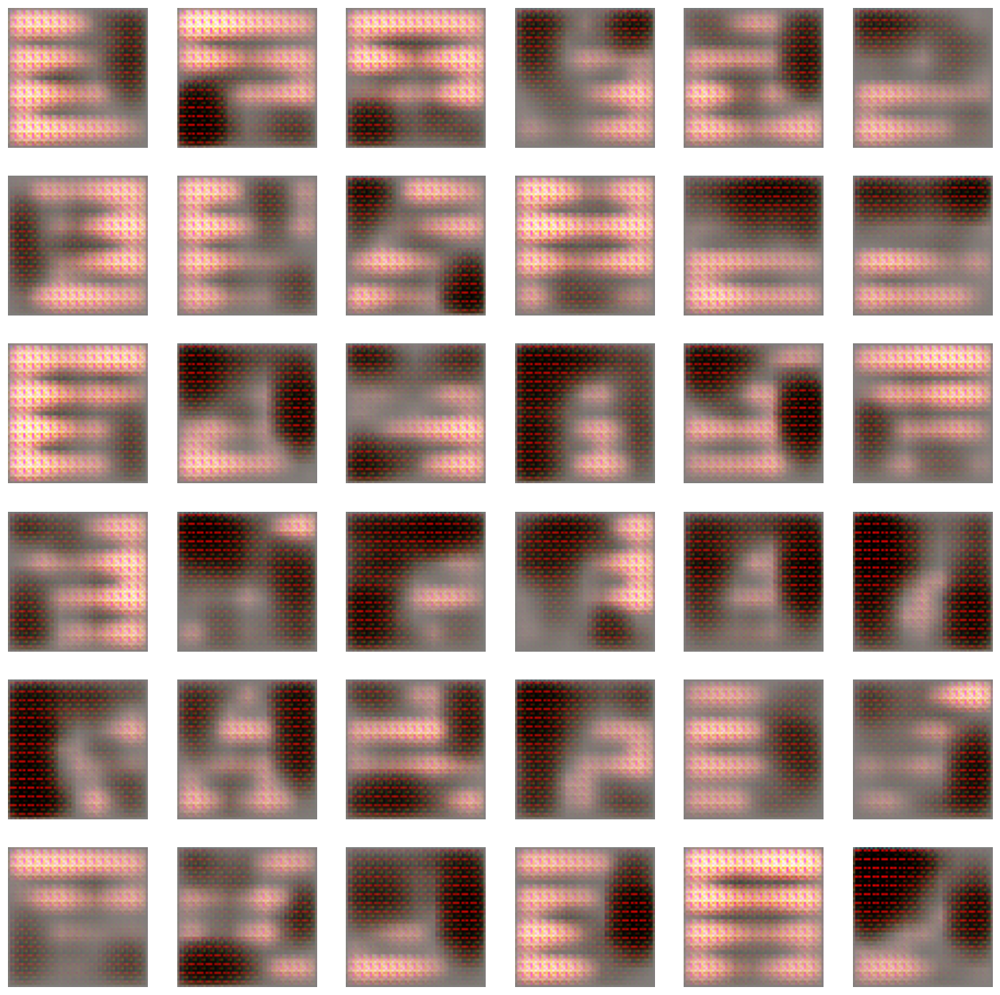

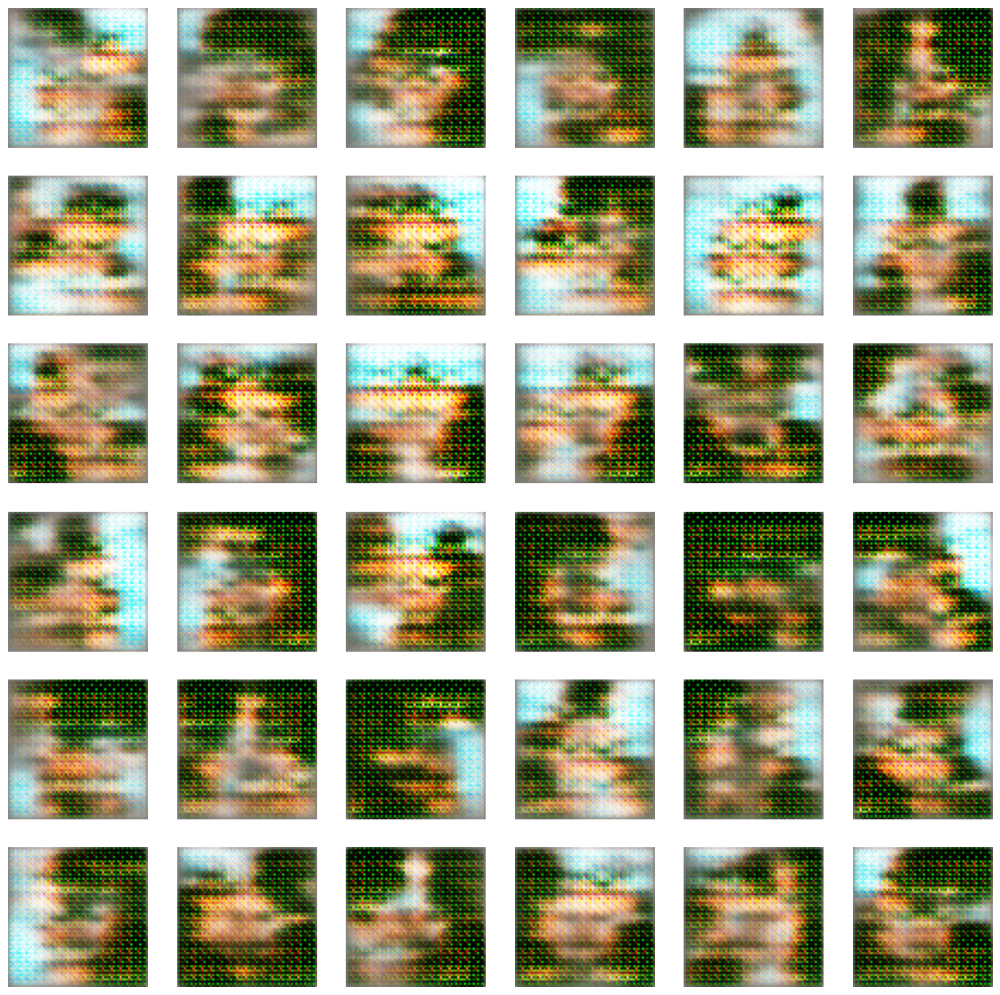

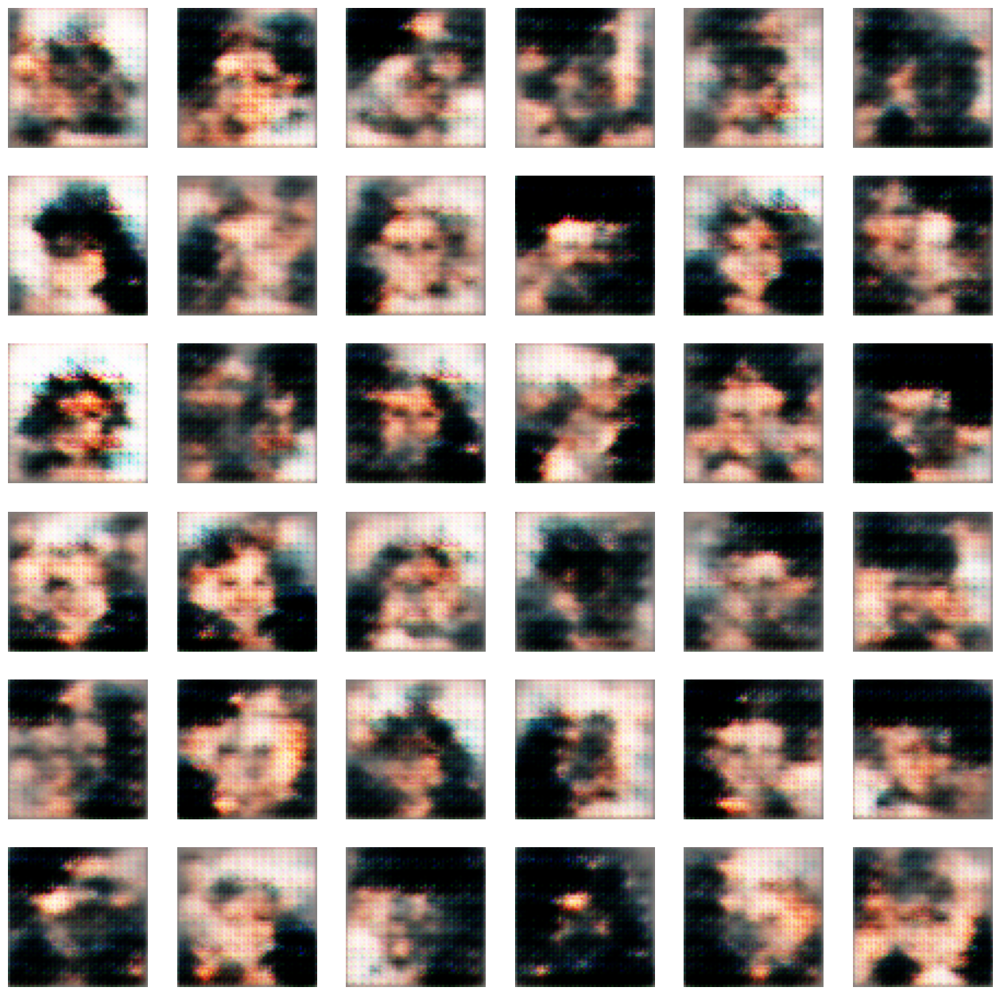

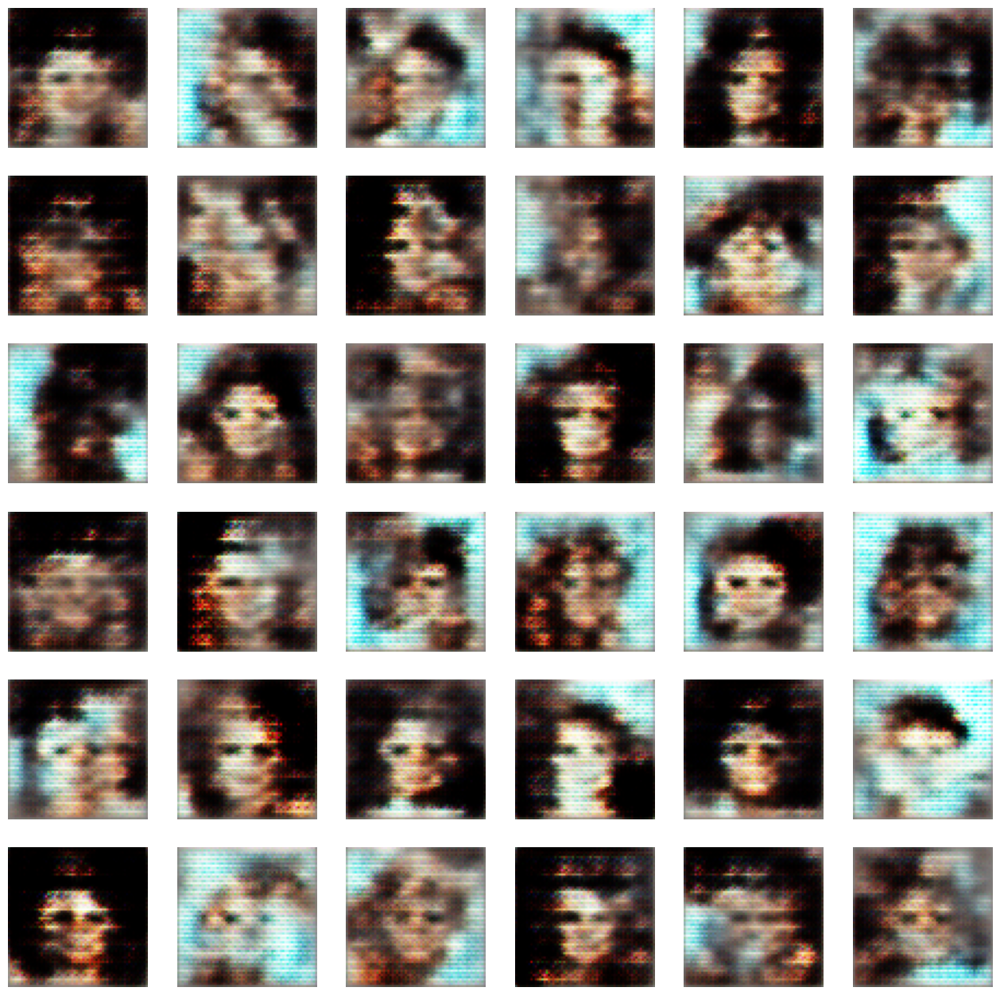

In [ ]:
history=gan.fit(train.take(100),epochs=EPOCHS,callbacks=[ShowImage(LATENT_DIM)])